In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        continue

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

<h2>Import Libraries</h2>

In [2]:
import os 
import matplotlib.pyplot as plt
import numpy as np 
import cv2 
import PIL
import pandas as pd
import re
from typing import List,Union,Dict

<h4>We will get Subcategories from dataset for EDA (TOP-5)</h4>

In [3]:
DATASET_DIR = "/kaggle/input/food-101/food-101/train"

category_counts = {}
for category in os.listdir(DATASET_DIR):
    folder = os.path.join(DATASET_DIR,category)
    if os.path.isdir(folder):
        category_counts[category] = len(os.listdir(folder))

sorted_cats = sorted(category_counts.items(), key=lambda x: x[1], reverse=True)
top_5_categories = [c[0] for c in sorted_cats[:5]]
print(f"Top 5 Categories: \n {top_5_categories}")

Top 5 Categories: 
 ['macarons', 'french_toast', 'lobster_bisque', 'prime_rib', 'pork_chop']


In [4]:
DATASET_DIR = "/kaggle/input/food-101/food-101/train"


In [5]:
width, height ,aspect_ratio , categories_list , resolution = [], [], [] , [] , []
for cat in os.listdir(DATASET_DIR)[:50]:
    folder = os.path.join(DATASET_DIR,cat)
    for image_name in os.listdir(folder):
        image_path = os.path.join(folder,image_name)
        try:
            image = PIL.Image.open(image_path)
            w,h = image.size
            width.append(w)
            height.append(h)
            resolution.append(w*h)
            aspect_ratio.append(w/h)
            categories_list.append(cat)
        except:
            continue


In [6]:
print("Number of Images Collected: ",len(width))

Number of Images Collected:  47500


<h2>EDA</h2>

<p>Image Dimension Visualization</p>

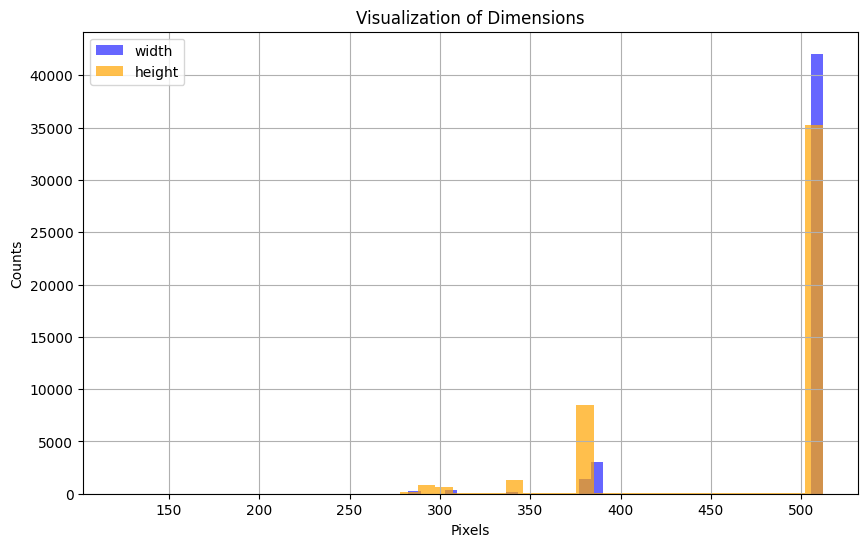

In [7]:
plt.figure(figsize=(10,6))
plt.hist(width,bins=40,alpha=0.6,color='blue',label='width')
plt.hist(height,bins=40,alpha=0.7,color='orange',label='height')
plt.xlabel("Pixels")
plt.ylabel("Counts")
plt.grid(True)
plt.legend()
plt.title("Visualization of Dimensions")
plt.show()

In [8]:
print(f"Values of width: \n{pd.Series(width).value_counts()}")
print(f"Length of Different width: {len(pd.Series(width).value_counts())}")


Values of width: 
512    41714
384     3014
382     1296
511      256
306      230
       ...  
503        1
402        1
279        1
338        1
449        1
Name: count, Length: 147, dtype: int64
Length of Different width: 147


In [9]:
print(f"Height of Images Values:\n {pd.Series(height).value_counts()}")
print(f"Length of Different Height Values: {len(pd.Series(height).value_counts())}")

Height of Images Values:
 512    34997
384     7007
382     1168
341      742
306      485
       ...  
254        1
430        1
213        1
272        1
414        1
Name: count, Length: 243, dtype: int64
Length of Different Height Values: 243


<p>Statistical info of width and height</p>

In [10]:
values = {"width":[np.max(width),np.min(width),np.median(width),np.mean(width)],"height":[np.max(height),np.min(height),np.median(height),np.mean(height)]}
stat_values = pd.DataFrame(data=values,index=["max","min","median","mean"])
stat_values

,width,height
max,512.000000,512.000000
min,242.000000,122.000000
median,512.000000,512.000000
mean,496.196421,474.911011


<p><em><b>We should preprocess the images to have the same width and height otherwise we will have problems<b></em></p>

<h4>Aspect Ratio Distribution</h4>

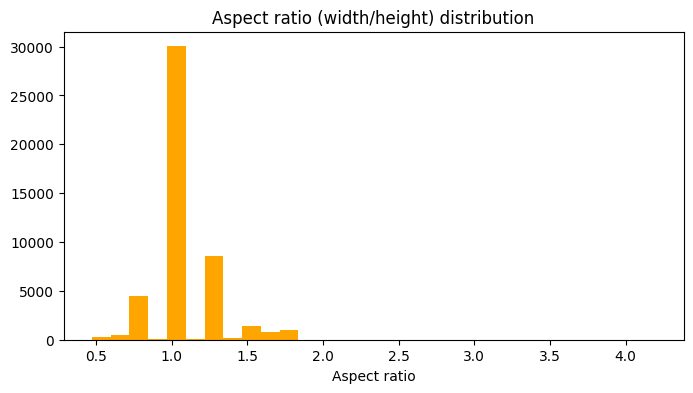

Aspect Ratio Values:1.000000    29211
1.333333     7007
0.750000     3014
0.746094     1296
1.340314     1168
            ...  
1.207547        1
1.082452        1
1.855072        1
1.802817        1
1.199063        1
Name: count, Length: 389, dtype: int64
Length of Aspect Ratio: 389


In [11]:
plt.figure(figsize=(8,4))
plt.hist(aspect_ratio, bins=30, color='orange')
plt.title("Aspect ratio (width/height) distribution")
plt.xlabel("Aspect ratio")
plt.show()

print(f"Aspect Ratio Values:{pd.Series(aspect_ratio).value_counts()}")
print(f"Length of Aspect Ratio: {len(pd.Series(aspect_ratio).value_counts()) }")


<p>Most of the images are squared (have same width and height) , but we have a variaty of images that are either wide or tall </p>

<h4>Resolution Histogram visualization</h4>


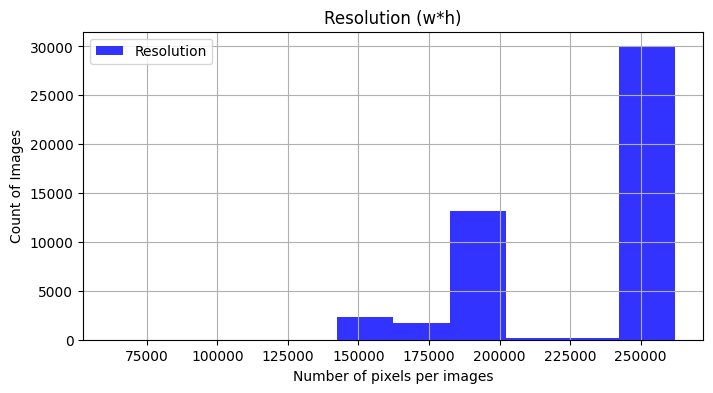

Minimum Resolution: 62464
Maximum Resolution: 262144


In [12]:
plt.figure(figsize=(8,4))
plt.hist(resolution,color='blue',label="Resolution",alpha=0.8)
plt.xlabel("Number of pixels per images")
plt.ylabel("Count of Images")
plt.legend()
plt.grid(True)
plt.title("Resolution (w*h)")
plt.show()

print(f"Minimum Resolution: {np.min(resolution)}")
print(f"Maximum Resolution: {np.max(resolution)}")

<p>We can that we have a lot of values that are below 250.000 pixels and that is a problem because we don't have a lot of information</p>

<h4>Outliers Detection</h4>

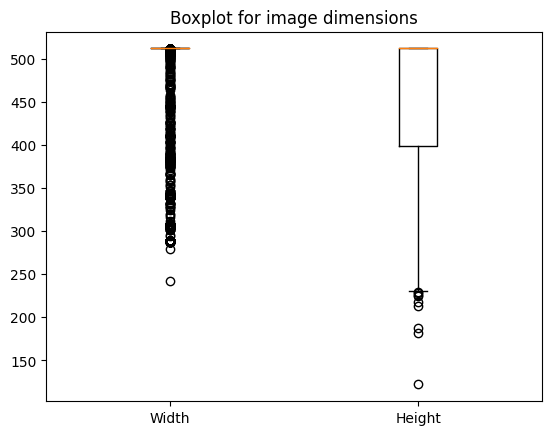

In [13]:

plt.boxplot([width, height], labels=['Width', 'Height'])
plt.title("Boxplot for image dimensions")
plt.show()


In [14]:
#we are going to do transform the list to np.arrays to make it faster
width = np.array(width)
height = np.array(height)

Q1_W,Q3_W = np.percentile(width,[25,75])
IQR_W = Q3_W-Q1_W
lower_bound_W = Q1_W-1.5*IQR_W 
higher_bound_W = Q3_W+1.5*IQR_W

Q1_H , Q3_H = np.percentile(height,[25,75])
IQR_H = Q3_H-Q1_H
lower_bound_H = Q1_H-1.5*IQR_H
higher_bound_H = Q3_H+1.5*IQR_H

print(f"Width bounds: [{lower_bound_W},{higher_bound_W}]")
print(f"Height bounds: [{lower_bound_H},{higher_bound_H}]")


Width bounds: [512.0,512.0]
Height bounds: [229.5,681.5]


In [15]:
outlier_indices = np.where(
    (width < lower_bound_W) | (width > higher_bound_W) |
    (height < lower_bound_H) | (height > higher_bound_H)
)[0]

print("Number of outliers:", len(outlier_indices))
print("Percentage of outliers: ",np.round(len(outlier_indices)*100/len(width),2))

Number of outliers: 5795
Percentage of outliers:  12.2


In [16]:
width, height ,aspect_ratio , categories_list , resolution = [], [], [] , [] , []
for cat in top_5_categories:
    folder = os.path.join(DATASET_DIR,cat)
    print(f"Processing: {cat}")
    for image_name in os.listdir(folder):
        image_path = os.path.join(folder,image_name)
        try:
            image = PIL.Image.open(image_path)
            w,h = image.size
            if (w < lower_bound_W) | (w > higher_bound_W) \
            | (h < lower_bound_H) | (h > higher_bound_H):
                continue
            width.append(w)
            height.append(h)
            resolution.append(w*h)
            aspect_ratio.append(w/h)
            categories_list.append(cat)
        except:
            continue


Processing: macarons
Processing: french_toast
Processing: lobster_bisque
Processing: prime_rib
Processing: pork_chop


In [17]:
print(f"Number of Images: {(len(width),len(height))}")

Number of Images: (4169, 4169)


<h2>Color & Lighting</h2>

In [18]:
def rgb_mean_cv2(bgr):
    #returns the rgb colors of each image
    #range [0,255]
    rgb = cv2.cvtColor(bgr,cv2.COLOR_BGR2RGB)
    r = rgb[...,0].mean()
    g = rgb[...,1].mean()
    b = rgb[...,2].mean()
    return r,g,b

def bright_contrast_cv2(bgr):
    #returns brightness and contrast per image
    gray = cv2.cvtColor(bgr,cv2.COLOR_BGR2GRAY)
    return gray.mean(), gray.std()




In [19]:
R_total, G_total , B_total = [],[],[]
Bright_total , Contrast_total = [],[]
for cat in top_5_categories:
    folder = os.path.join(DATASET_DIR,cat)
    print(f"Processing: {cat}")
    for image_name in os.listdir(folder):
        image_path = os.path.join(folder,image_name)
        try:
            img = cv2.imread(image_path,cv2.IMREAD_COLOR)
            if img is None:
                continue
            h,w,c = img.shape
            if (w < lower_bound_W) | (w > higher_bound_W) \
            | (h < lower_bound_H) | (h > higher_bound_H):
                continue
            r,g,b = rgb_mean_cv2(img)
            br,ct = bright_contrast_cv2(img)    
            R_total.append(r); G_total.append(g); B_total.append(b)
            Bright_total.append(br); Contrast_total.append(ct)
        except:
            continue


Processing: macarons
Processing: french_toast
Processing: lobster_bisque
Processing: prime_rib
Processing: pork_chop


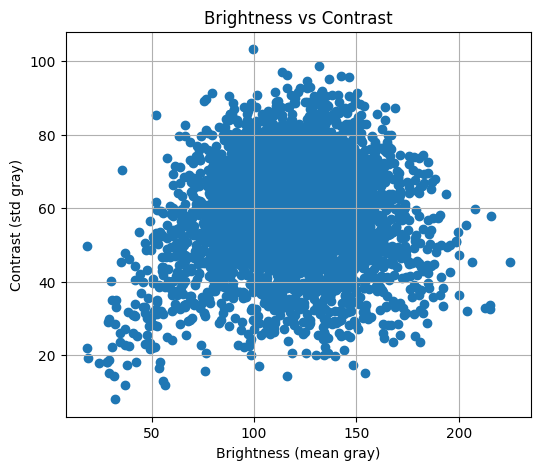

In [20]:
plt.figure(figsize=(6,5))
plt.scatter(Bright_total,Contrast_total)
plt.xlabel("Brightness (mean gray)")
plt.ylabel("Contrast (std gray)")
plt.grid()
plt.title("Brightness vs Contrast")
plt.show()

<p>As we can see a lot of images had close to balanced contrast and brightness except of some exceptions that had or more brightness or more contrast</p>

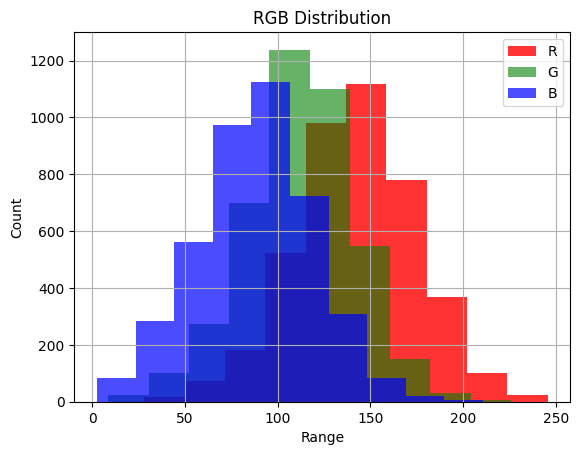

In [21]:
plt.hist(R_total,label='R',alpha=0.8,color='red')
plt.hist(G_total,label='G',alpha=0.6,color='green')
plt.hist(B_total,label='B',alpha=0.7,color='blue')
plt.ylabel("Count")
plt.xlabel("Range")
plt.grid()
plt.legend()
plt.title('RGB Distribution')
plt.show()

<p>A lot of images had more red than the other colors and less blue </p>

<h2>Image Quality Issues</h2>


In [22]:
def laplacian_variance(img):
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    return float(cv2.Laplacian(gray,ddepth=cv2.CV_64F,ksize=3).var())
    

In [23]:
blur_scores = []
for cat in top_5_categories:
    folder = os.path.join(DATASET_DIR,cat)
    for image_path in os.listdir(folder):
        image = os.path.join(folder,image_path)
        try:
            img = cv2.imread(image,cv2.IMREAD_COLOR)
            if img is None:
                continue
            h,w,c = img.shape
            if (w < lower_bound_W) | (w > higher_bound_W) \
            | (h < lower_bound_H) | (h > higher_bound_H):
                continue
            score = laplacian_variance(img)
            blur_scores.append(score)
        except:
            continue
            

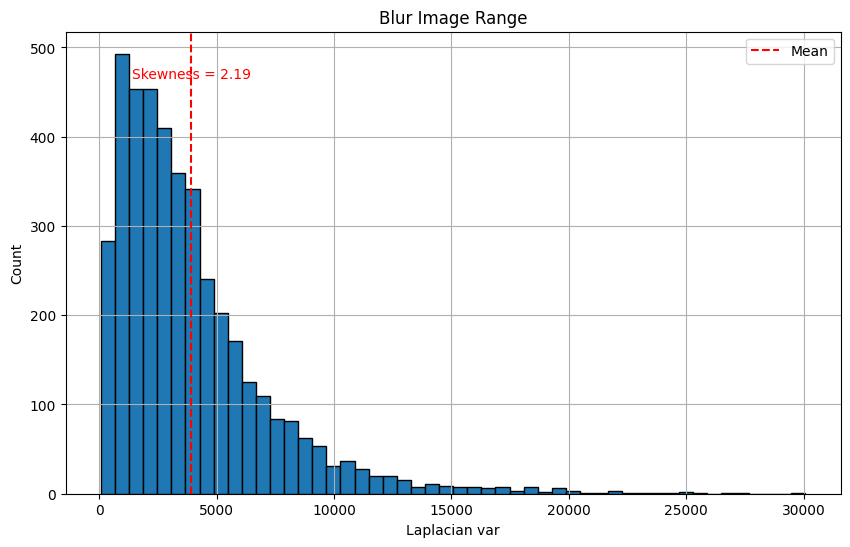

In [24]:
from scipy.stats import skew 

s = skew(blur_scores)

plt.figure(figsize=(10,6))
plt.hist(blur_scores,bins=50,edgecolor='black')
plt.title("Blur Image Range")
plt.grid()
plt.axvline(np.mean(blur_scores), color='red', linestyle='--', label='Mean')
plt.text(np.mean(blur_scores), plt.ylim()[1]*0.9, f"Skewness = {s:.2f}", 
         color='red', fontsize=10, ha='center')
plt.xlabel("Laplacian var")
plt.ylabel("Count")
plt.legend()
plt.show()


<p>Higher Laplacian var = More Sharp images</p></br>
<p>In the plot we can see due to the right skew we have more blurry images rather than sharp images</p>

<h2>Class Distirbution Analysis</h2>

In [25]:
count_per_class= {}
for cat in top_5_categories:
    folder = os.path.join(DATASET_DIR,cat)
    if not os.path.isdir(folder):
        counts_per_class[cat] = 0
    else:
        count_per_class[cat] = sum(
            1 for f in os.listdir(folder)
        )



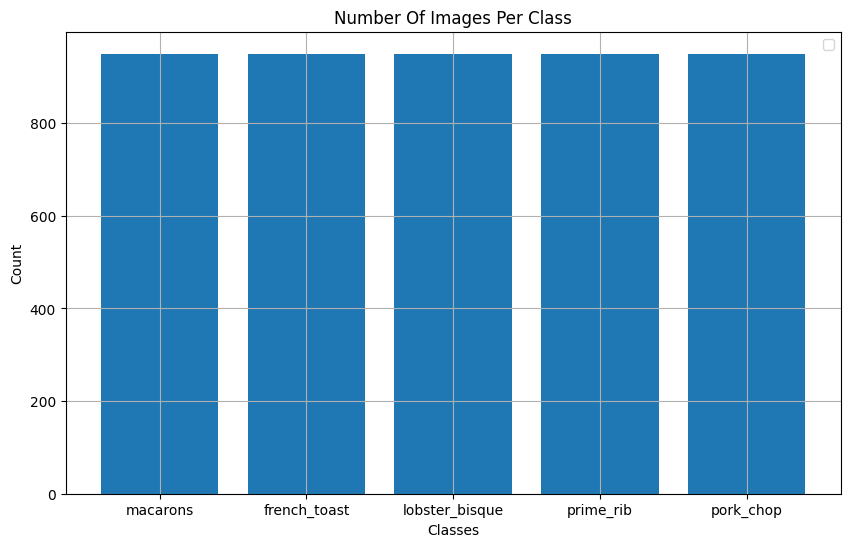

In [26]:
cats = list(count_per_class.keys())
counts_class = [count_per_class[c] for c in cats]

plt.figure(figsize=(10,6))
plt.bar(cats,counts_class)
plt.title("Number Of Images Per Class")
plt.xlabel("Classes")
plt.ylabel("Count")
plt.grid(True)
plt.legend()
plt.show()

In [27]:
for cat in cats:
    print(f"Length of Cat: {count_per_class[cat]}")

Length of Cat: 950
Length of Cat: 950
Length of Cat: 950
Length of Cat: 950
Length of Cat: 950



<p>So we can see an evenly distribution of images all of them have the same size</p>
<p>So the imbalance ratio = 1 so we have balanced ratio</p>

<h2>Preprocessing</h2>

In [28]:
print(f"Width: [{lower_bound_W},{higher_bound_W}]")
print(f"Height: [{lower_bound_H},{higher_bound_H}]")

Width: [512.0,512.0]
Height: [229.5,681.5]


<p>We are going to make the images 512*512</p>

In [29]:
TARGET_SIZE=512

In [30]:
def normalize_img(img,size=512,pad_color=0):
    h ,w = img.shape[:2]
    if w!= TARGET_SIZE:
        aspect_ratio = h/w
        new_h = int(TARGET_SIZE*aspect_ratio)
        img = cv2.resize(img,(TARGET_SIZE,new_h),interpolation=cv2.INTER_AREA)

        h,w = img.shape[:2]
    if h <TARGET_SIZE:
        img = pad_height(img,TARGET_SIZE,pad_color)
    elif h > TARGET_SIZE:
        img = crop_height(img)

    return img

    

def pad_height(img,target,pad_value=0):
    h,w = img.shape[:2]
    if h>= TARGET_SIZE:
        return img 
    padding_needed = TARGET_SIZE-h
    pad_top = padding_needed//2
    pad_bottom = padding_needed-pad_top

    return cv2.copyMakeBorder(img,pad_top,pad_bottom,0,0,cv2.BORDER_CONSTANT,value=(pad_color,pad_color,pad_color))

def crop_height(img):
    h,w = img.shape[:2]
    if h <= TARGET_SIZE:
        return img
    crop_amount = h-TARGET_SIZE
    crop_top = crop_amount//2
    crop_bottom = crop_top+TARGET_SIZE
    return img[crop_top:crop_bottom,:]
    

In [31]:
images = []
pad_color= 0
for cat in top_5_categories:
    folder = os.path.join(DATASET_DIR,cat)
    print(f"Pre-process: {cat}")
    for images_path in os.listdir(folder):
        try:
            image = os.path.join(folder,images_path)
            img = cv2.imread(image,cv2.IMREAD_COLOR)
            if img is None:
                continue
            img_normalized = normalize_img(img,pad_color)
            images.append(img_normalized)
        except Exception as e:
            raise ValueError("Error")
            

Pre-process: macarons
Pre-process: french_toast
Pre-process: lobster_bisque
Pre-process: prime_rib
Pre-process: pork_chop


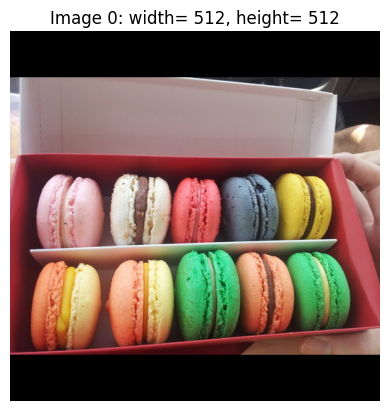

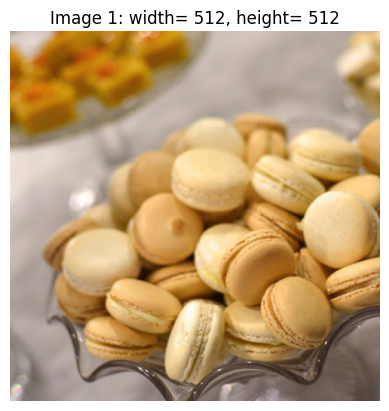

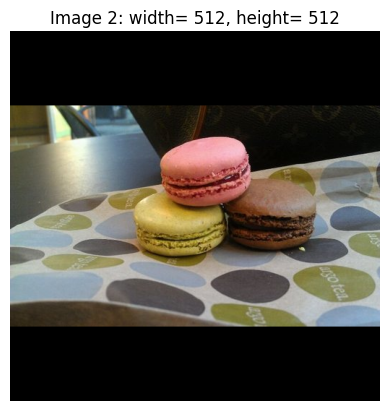

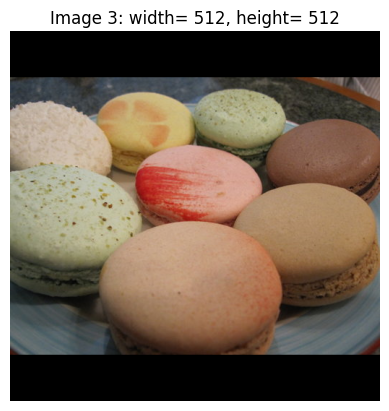

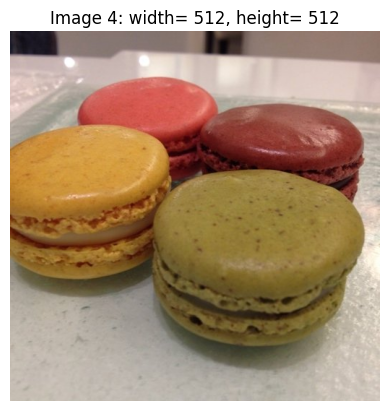

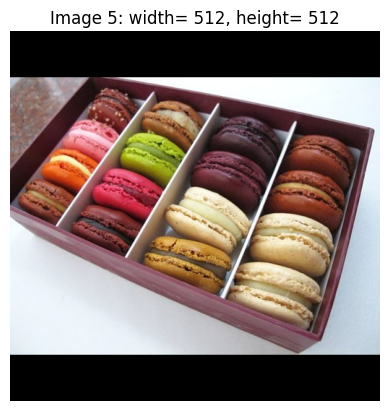

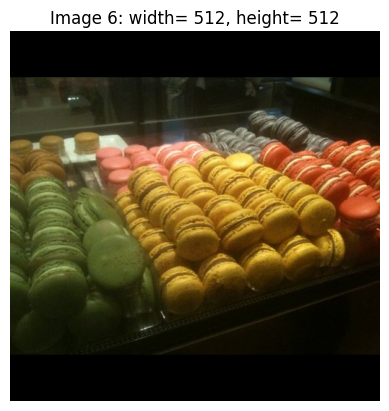

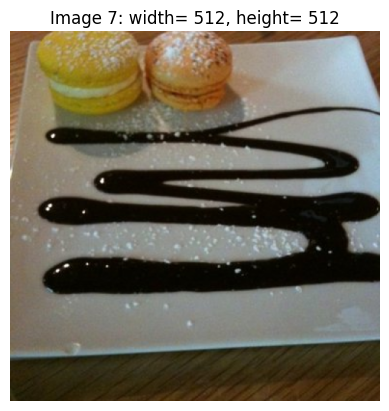

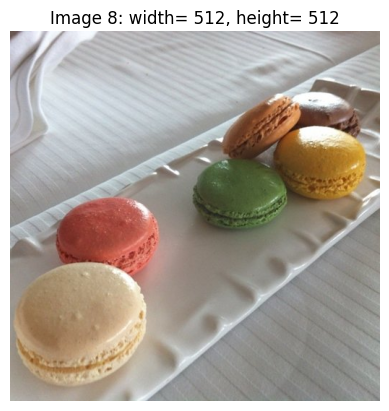

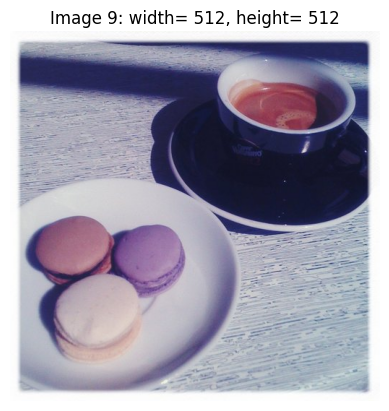

In [32]:
for i,img in enumerate(images[:10]):
    h,w = img.shape[:2]
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    plt.title(f"Image {i}: width= {w}, height= {h}")
    plt.axis("off")
    plt.show()

<p>we scale the images to have aspect ratio =1 , so width and height be the same (512*512)px</p>

In [33]:
def normalize_lighting_clahe(img_bgr, clip_limit=2.0, tile_grid_size=(8,8)):
    lab = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    l2 = clahe.apply(l)
    lab2 = cv2.merge((l2, a, b))
    return cv2.cvtColor(lab2, cv2.COLOR_LAB2BGR)

In [34]:
bright_normalise= []
for image in images:
    img_lit = normalize_lighting_clahe(image)
    bright_normalise.append(img_lit)

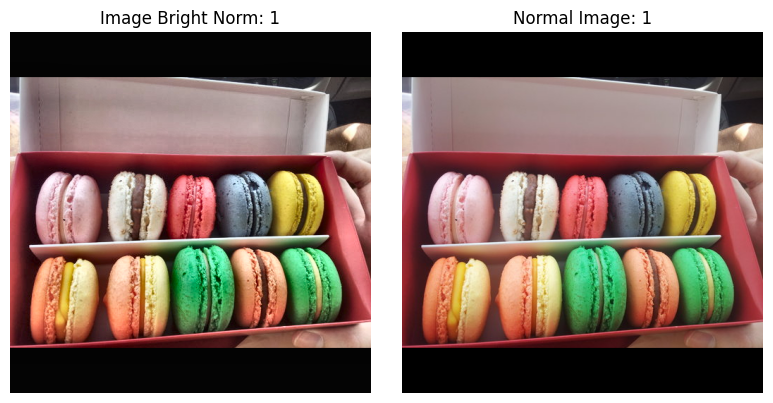

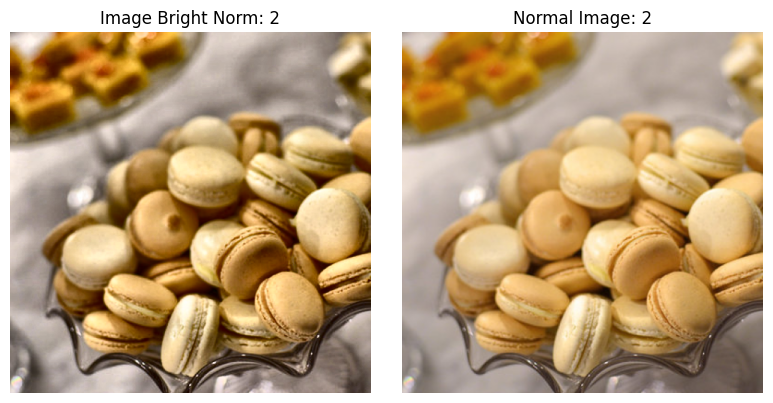

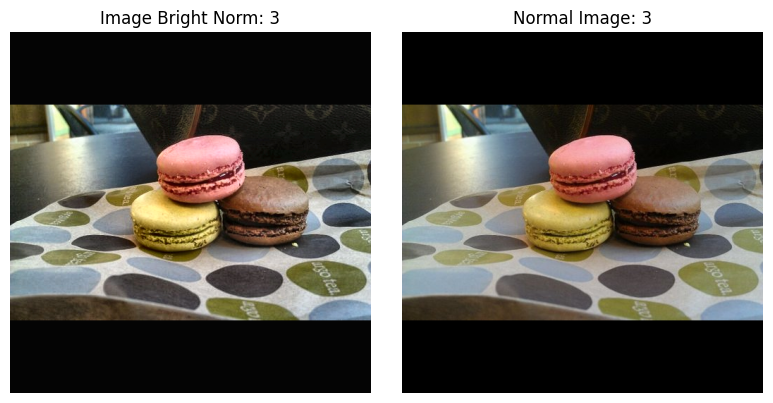

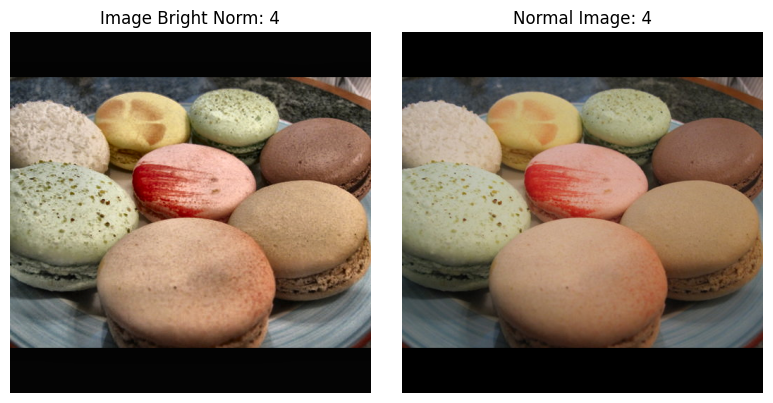

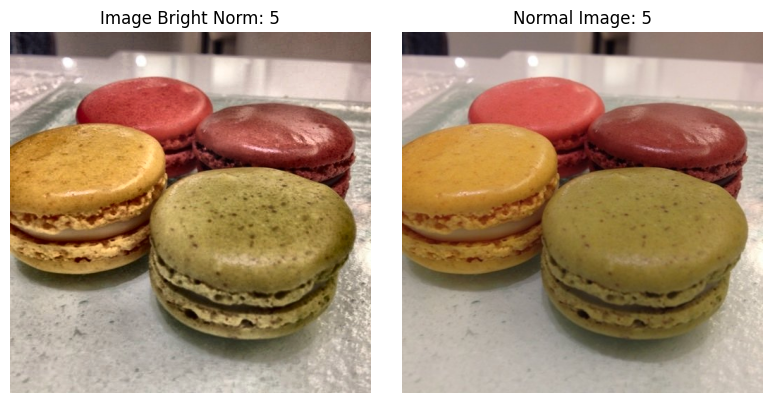

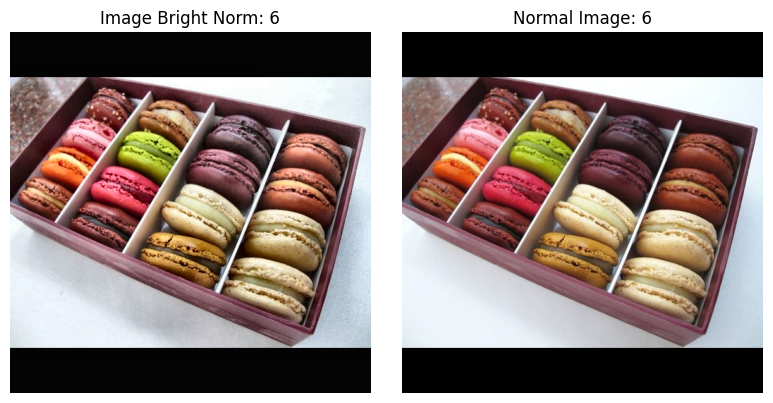

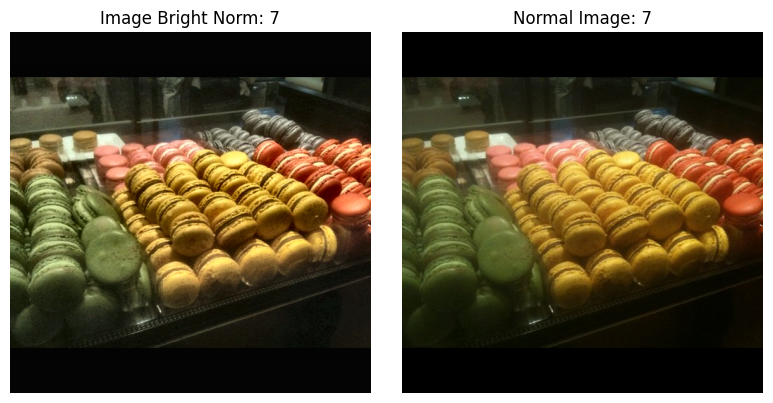

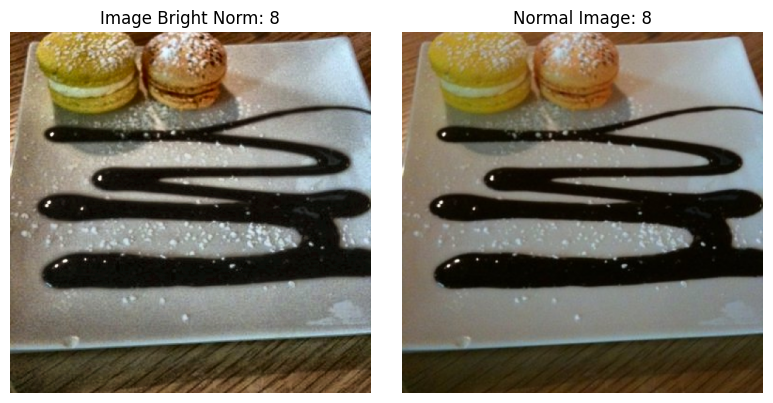

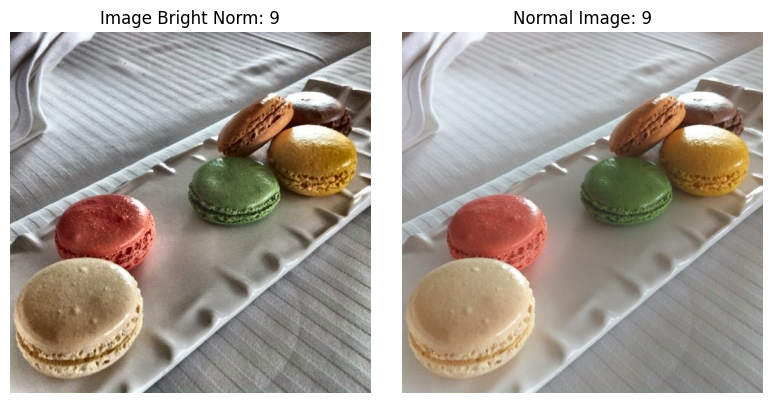

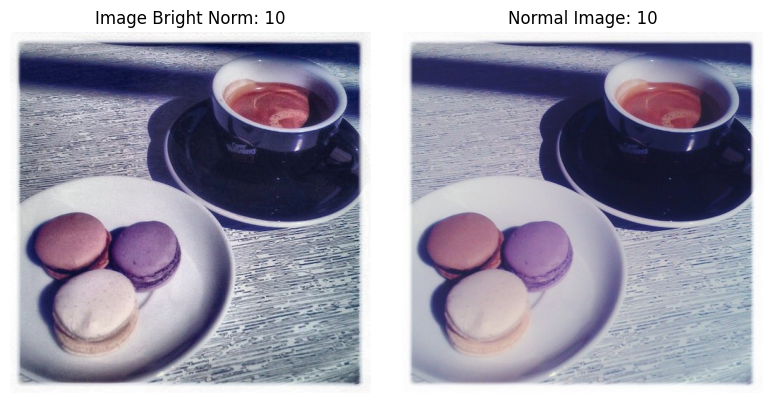

In [35]:
for i, image in enumerate(bright_normalise[:10]):
    plt.figure(figsize=(8,4))
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    plt.title(f"Image Bright Norm: {i+1}")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(cv2.cvtColor(images[i],cv2.COLOR_BGR2RGB))
    plt.title(f"Normal Image: {i+1}")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

<h3>Color Normalization</h3>

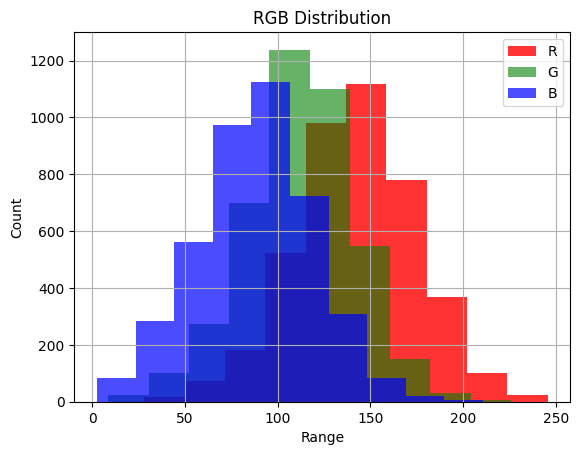

Red: [27.923080444335938,245.69349670410156]
Green: [8.68954086303711,225.78264181634898]
Blue: [2.47393798828125,210.76901245117188]


In [36]:
plt.hist(R_total,label='R',alpha=0.8,color='red')
plt.hist(G_total,label='G',alpha=0.6,color='green')
plt.hist(B_total,label='B',alpha=0.7,color='blue')
plt.ylabel("Count")
plt.xlabel("Range")
plt.grid()
plt.legend()
plt.title('RGB Distribution')
plt.show()
print(f"Red: [{np.min(R_total)},{np.max(R_total)}]")
print(f"Green: [{np.min(G_total)},{np.max(G_total)}]")
print(f"Blue: [{np.min(B_total)},{np.max(B_total)}]")

<p>so as we can see the color red is stronger so most of the images are more "warm"
</p>

In [37]:
def gray_world(img_bgr):
    avg_b , avg_g , avg_r = [img_bgr[...,i].mean() for i in range(3)]
    gray_g = (avg_b+avg_g+avg_r)/3
    scale = [avg_b/gray_g,avg_g/gray_g,avg_r/gray_g]
    b_bal = cv2.multiply(img_bgr[...,0], scale[0])
    g_bal = cv2.multiply(img_bgr[...,1], scale[1])
    r_bal = cv2.multiply(img_bgr[...,2], scale[2])
    balanced = cv2.merge([
        b_bal,
        g_bal,
        r_bal
    ])
    return np.clip(balanced,0,255).astype(np.uint8), b_bal,g_bal,r_bal
    

In [38]:
color_norm_images = []
R_norm , G_norm , B_norm = [], [], []
for image in images:
    col_n_img,b_val,g_val,r_val = gray_world(image)
    color_norm_images.append(col_n_img)
    R_norm.append(r_val)
    G_norm.append(g_val)
    B_norm.append(b_val)

In [39]:
print(f"Red Range: [{np.min(R_norm)},{np.max(R_norm)}]")
print(f"Green Range: [{np.min(G_norm)},{np.max(G_norm)}]")
print(f"Blue Range: [{np.min(B_norm)},{np.max(B_norm)}]")

Red Range: [0,255]
Green Range: [0,255]
Blue Range: [0,255]


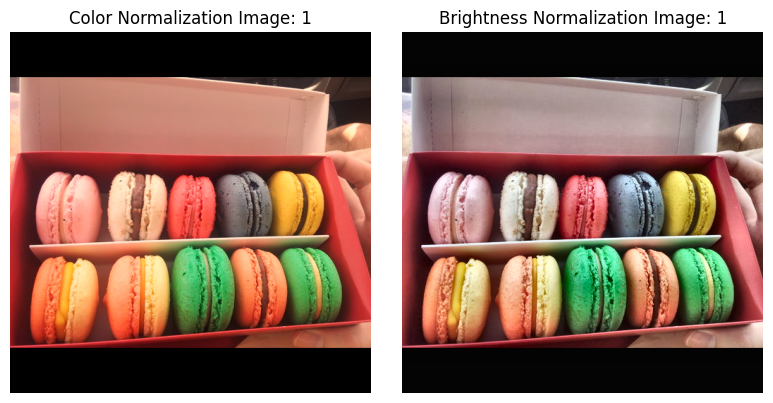

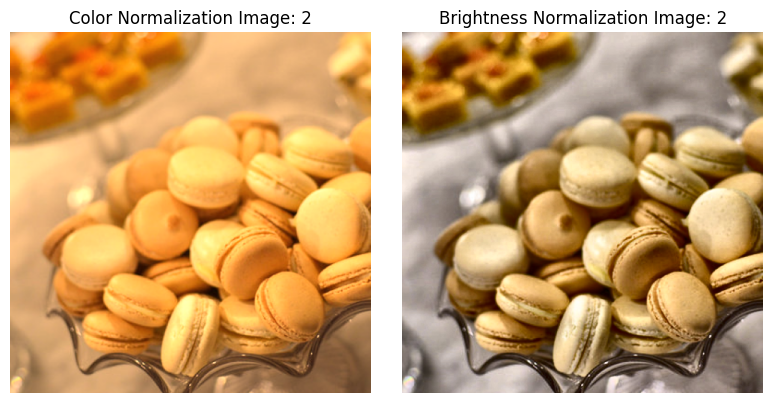

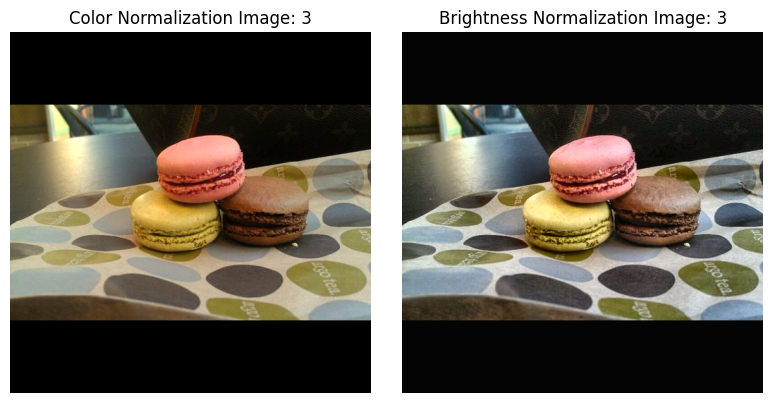

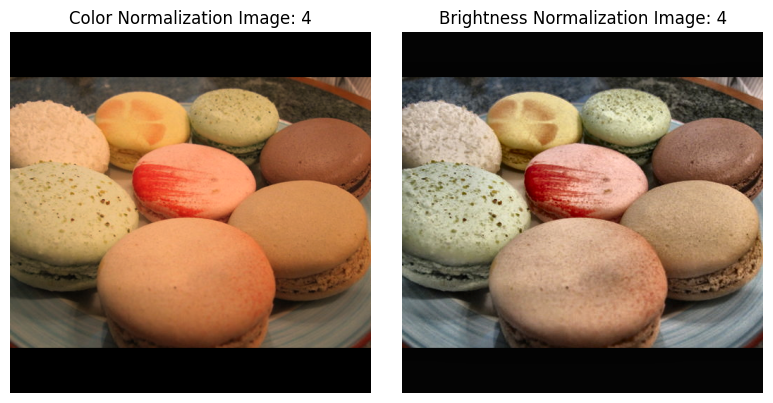

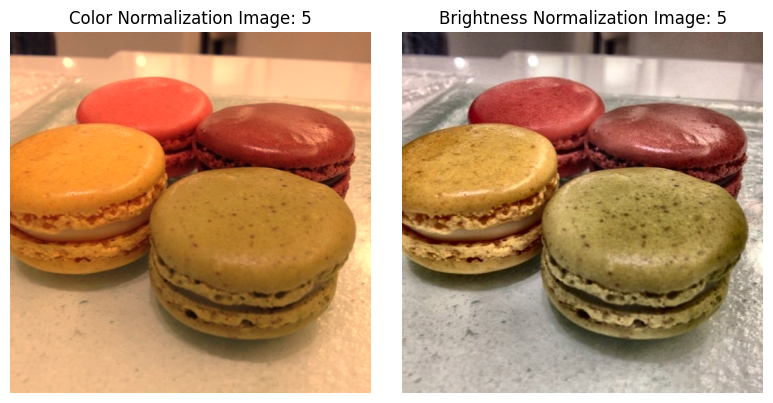

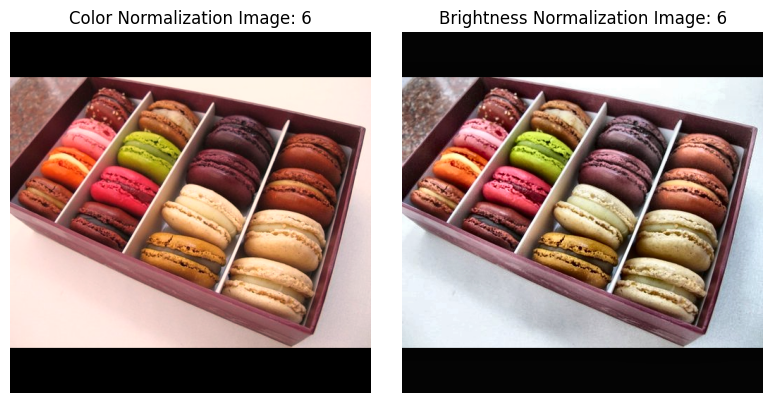

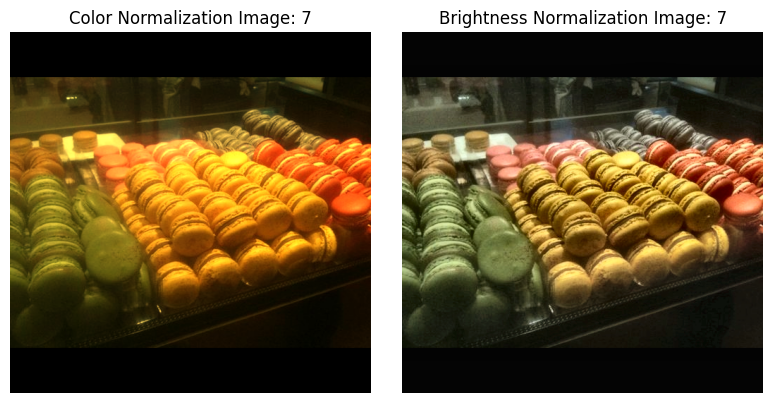

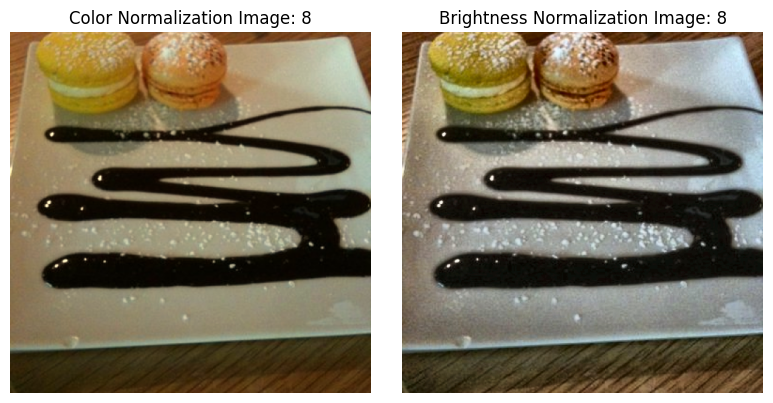

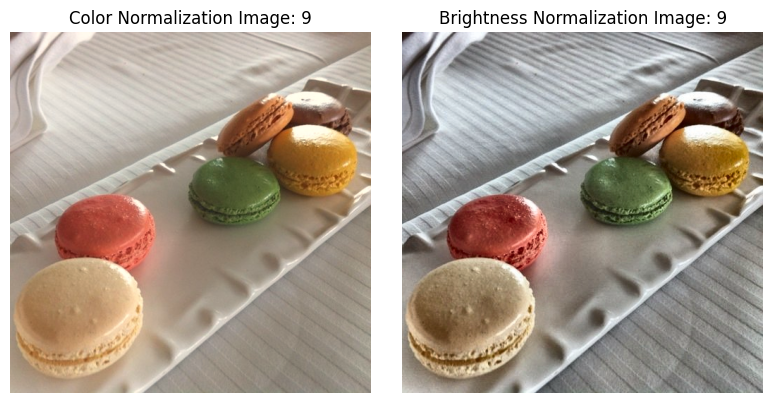

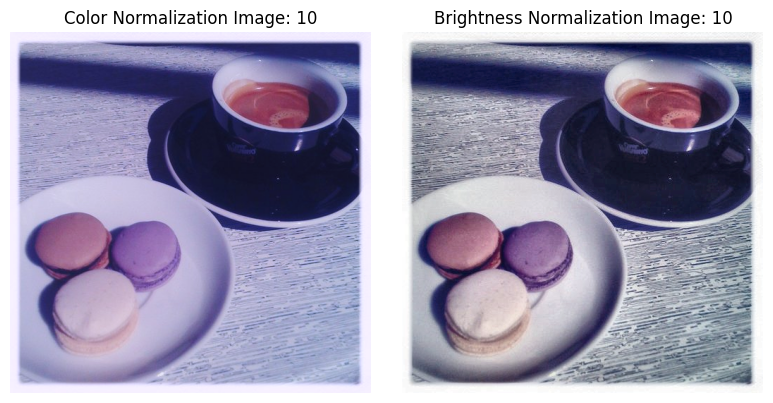

In [40]:
for i,image in enumerate(color_norm_images[:10]):
    plt.figure(figsize=(8,4))
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    plt.title(f"Color Normalization Image: {i+1}")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(cv2.cvtColor(bright_normalise[i],cv2.COLOR_BGR2RGB))
    plt.title(f"Brightness Normalization Image: {i+1}")
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    

<p>Now as we can see the colors in the image are more balanced and they aren't so warm</p>

<h3>Blur Filtering</h3>

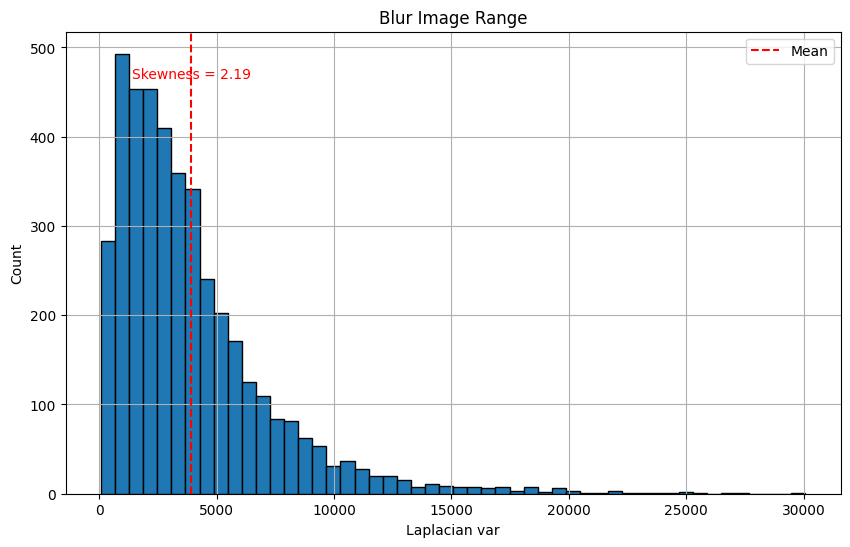

In [41]:
from scipy.stats import skew 

s = skew(blur_scores)

plt.figure(figsize=(10,6))
plt.hist(blur_scores,bins=50,edgecolor='black')
plt.title("Blur Image Range")
plt.grid()
plt.axvline(np.mean(blur_scores), color='red', linestyle='--', label='Mean')
plt.text(np.mean(blur_scores), plt.ylim()[1]*0.9, f"Skewness = {s:.2f}", 
         color='red', fontsize=10, ha='center')
plt.xlabel("Laplacian var")
plt.ylabel("Count")
plt.legend()
plt.show()


<p>As we saw before from the above plot we have more blur images rather than sharp ones so we have to fix this </p>

In [42]:
def laplacian_variance(img):
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    return float(cv2.Laplacian(gray,ddepth=cv2.CV_64F,ksize=3).var())


In [43]:
def unsharp_mask(img, ksize=(5,5), strength=1.5):
    blur = cv2.GaussianBlur(img, ksize, 0)
    sharp = cv2.addWeighted(img, 1 + strength, blur, -strength, 0)
    return sharp

In [44]:
blur_score =[]
img_sharped= []
for image in color_norm_images:
    img = unsharp_mask(image)
    blu = laplacian_variance(img)
    img_sharped.append(img)
    blur_score.append(blu)


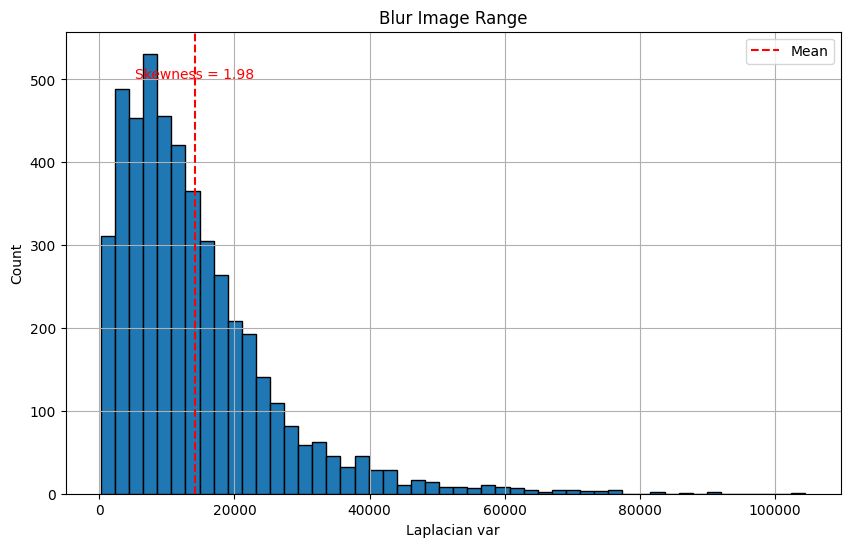

In [45]:
from scipy.stats import skew 

s = skew(blur_score)

plt.figure(figsize=(10,6))
plt.hist(blur_score,bins=50,edgecolor='black')
plt.title("Blur Image Range")
plt.grid()
plt.axvline(np.mean(blur_score), color='red', linestyle='--', label='Mean')
plt.text(np.mean(blur_score), plt.ylim()[1]*0.9, f"Skewness = {s:.2f}", 
         color='red', fontsize=10, ha='center')
plt.xlabel("Laplacian var")
plt.ylabel("Count")
plt.legend()
plt.show()


<h2>Model & Data Preparation</h2>

In [46]:
import os
import shutil

# --- Paths ---
SOURCE_DIR = "/kaggle/input/food-101/food-101"
SRC_TRAIN = os.path.join(SOURCE_DIR, "train")
SRC_VAL = os.path.join(SOURCE_DIR, "validation")
DEST_DIR = "/kaggle/working/food-30"  # must be in /kaggle/working to be writable

# --- Pick 30 classes alphabetically ---
all_labels = sorted([d for d in os.listdir(SRC_TRAIN) if os.path.isdir(os.path.join(SRC_TRAIN, d))])
selected_labels = all_labels[:30]  # first 30 alphabetically

print(f"📁 Selected {len(selected_labels)} classes:")
print(selected_labels)

# --- Create new directories and copy images ---
def safe_copy(src_dir, dst_dir):
    """Copy files if src exists; return number of copied images."""
    if not os.path.exists(src_dir):
        return 0
    os.makedirs(dst_dir, exist_ok=True)
    count = 0
    for img in os.listdir(src_dir):
        s = os.path.join(src_dir, img)
        d = os.path.join(dst_dir, img)
        if os.path.isfile(s):
            shutil.copy2(s, d)
            count += 1
    return count

# Create and copy for both splits
for split in ["train", "validation"]:
    print(f"\n🔄 Copying {split} data...")
    for label in selected_labels:
        src = os.path.join(SOURCE_DIR, split, label)
        dst = os.path.join(DEST_DIR, split, label)
        copied = safe_copy(src, dst)
        print(f"{label:25s} → {copied:4d} images")

print("\n✅ Done! New subset created at:", DEST_DIR)


📁 Selected 30 classes:
['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare', 'beet_salad', 'beignets', 'bibimbap', 'bread_pudding', 'breakfast_burrito', 'bruschetta', 'caesar_salad', 'cannoli', 'caprese_salad', 'carrot_cake', 'ceviche', 'cheese_plate', 'cheesecake', 'chicken_curry', 'chicken_quesadilla', 'chicken_wings', 'chocolate_cake', 'chocolate_mousse', 'churros', 'clam_chowder', 'club_sandwich', 'crab_cakes', 'creme_brulee', 'croque_madame', 'cup_cakes']

🔄 Copying train data...
apple_pie                 →  950 images
baby_back_ribs            →  950 images
baklava                   →  950 images
beef_carpaccio            →  950 images
beef_tartare              →  950 images
beet_salad                →  950 images
beignets                  →  950 images
bibimbap                  →  950 images
bread_pudding             →  950 images
breakfast_burrito         →  950 images
bruschetta                →  950 images
caesar_salad              →  950 images
cannoli

In [47]:
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dropout, Dense , GlobalAveragePooling2D,Input 
from tensorflow import keras
from tensorflow.keras import layers, Sequential

2025-11-08 14:47:16.902746: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1762613237.302826      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1762613237.421265      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [48]:
BATCH = 32
SEED =42
AUTOTUNE = tf.data.AUTOTUNE
IMG_SIZE = (224,224)
DATA_ROOT = "/kaggle/working/food-30"
TRAIN_DIR = f"{DATA_ROOT}/train"
TEST_DIR = f"{DATA_ROOT}/validation"

In [49]:
VAL_SPLIT = 0.2

train_ds = keras.utils.image_dataset_from_directory(
    TRAIN_DIR,
    labels="inferred",
    label_mode="int",
    validation_split=VAL_SPLIT,
    subset="training",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH,
)

val_ds = keras.utils.image_dataset_from_directory(
    TRAIN_DIR,
    labels="inferred",
    label_mode="int",
    validation_split=VAL_SPLIT,
    subset="validation",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH,
)


Found 28500 files belonging to 30 classes.
Using 22800 files for training.


I0000 00:00:1762613256.676690      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1762613256.677302      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Found 28500 files belonging to 30 classes.
Using 5700 files for validation.


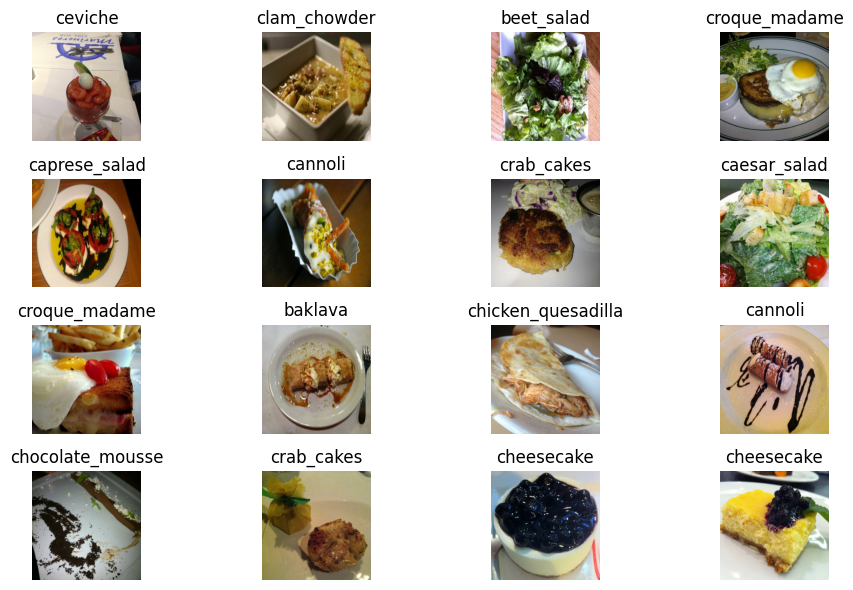

In [50]:
import matplotlib.pyplot as plt

classes = train_ds.class_names

images,labels = next(iter(train_ds))

plt.figure(figsize=(10,6))
for i in range(16):
    ax = plt.subplot(4, 4, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    label = classes[labels[i]]
    plt.title(f"{label}")
    plt.axis("off")

plt.tight_layout()
plt.show()

Create a tf.data input pipeline: convert tensors to a dataset, shuffle when training,
then batch and prefetch for efficient model training.

In [51]:
data_augmentation = Sequential([
    layers.Resizing(*IMG_SIZE),
    layers.Rescaling(1./255),
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1)
])


<p>we do the data augmentation so that in every epoch the Neural Network get a sligtly different picture from the previous time so that we can see what does the model learn </p>

In [52]:
base_model = MobileNetV2(
    input_shape=(*IMG_SIZE,3),
    include_top=False,
    weights='imagenet'
)
base_model.trainable=False

inputs = Input(shape=(*IMG_SIZE,3))
x = data_augmentation(inputs)
x = base_model(x,training=False)
x = GlobalAveragePooling2D()(x)
x = Dense(128,activation='relu')(x)
x = Dense(64,activation='relu')(x)
outputs = Dense(30,activation='softmax')(x)
model = Model(inputs,outputs)

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


<p>we used a pre-trained model and trained it to our problem</p>

In [53]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 30)             │         1,950 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,432,158 (9.28 MB)

 Trainable params: 174,174 (680.37 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

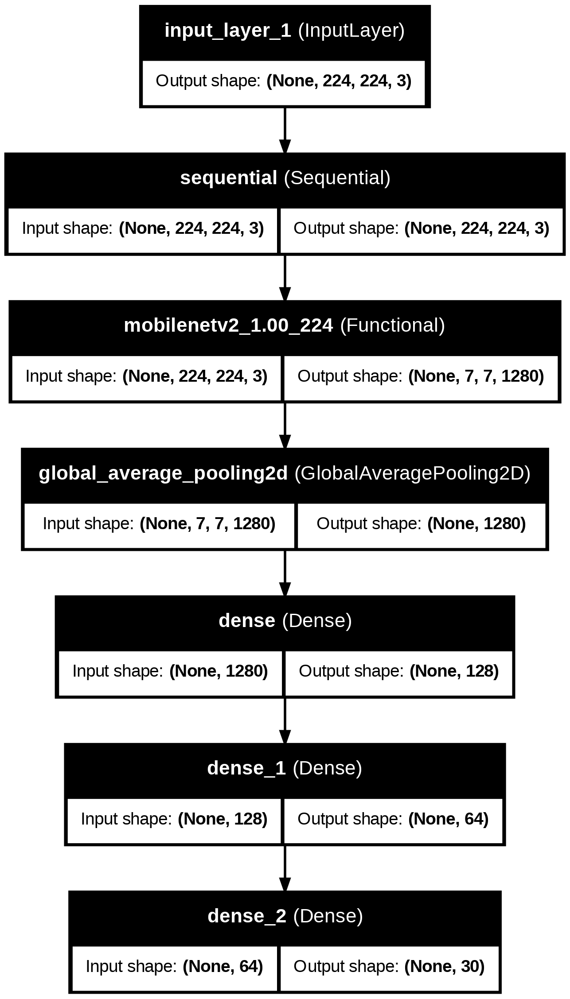

In [54]:
tf.keras.utils.plot_model(model,show_shapes=True,show_layer_names=True)

In [55]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [56]:
history= model.fit(train_ds, validation_data=val_ds, epochs=10)

Epoch 1/10


I0000 00:00:1762613277.507983      75 cuda_dnn.cc:529] Loaded cuDNN version 90300


713/713 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - accuracy: 0.1748 - loss: 2.9920 - val_accuracy: 0.4875 - val_loss: 1.8337
Epoch 2/10
713/713 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - accuracy: 0.5064 - loss: 1.7460 - val_accuracy: 0.5661 - val_loss: 1.5232
Epoch 3/10
713/713 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - accuracy: 0.5693 - loss: 1.4937 - val_accuracy: 0.5998 - val_loss: 1.4058
Epoch 4/10
713/713 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.6021 - loss: 1.3817 - val_accuracy: 0.6153 - val_loss: 1.3458
Epoch 5/10
713/713 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.6211 - loss: 1.3087 - val_accuracy: 0.6233 - val_loss: 1.3110
Epoch 6/10
713/713 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.6387 - loss: 1.2560 - val_accuracy: 0.6339 - val_loss: 1.2790
Epoch 7/10
713/713 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.6495 - loss: 1.2118 - val_accuracy: 0.6379 - val_loss: 1.2585
Epoch 8/10
713/713 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.6571 - loss: 1.1668 - val_accurac

<ul>
    <li>Optimizer: we decided to go with adams </li>
    <li>loss: we chose sparse_categorical_crossentropy because we transform the cateogrical values to numerical</li>
    <li>Metrics: we care about accuracy of the model so we are going with this </li>
</ul>

<h2>Plot Metrics</h2>

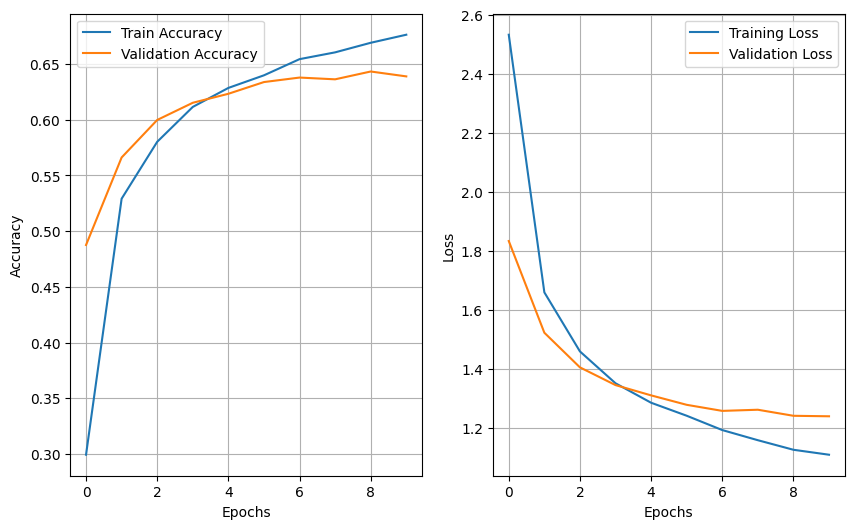

In [57]:
import matplotlib.pyplot as plt 

plt.figure(figsize=(10,6))
plt.subplot(1,2,1)
plt.plot(history.history['accuracy'],label="Train Accuracy")
plt.plot(history.history['val_accuracy'],label='Validation Accuracy')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.grid(True)
plt.legend()


plt.subplot(1,2,2)
plt.plot(history.history['loss'],label="Training Loss")
plt.plot(history.history['val_loss'],label='Validation Loss')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.grid(True)
plt.legend()

plt.show()

<h2>Evaluation Of Model</h2>

In [58]:
test_dataset = keras.utils.image_dataset_from_directory(
    TEST_DIR,
    labels='inferred',
    label_mode='int',
    shuffle=False,
    batch_size = BATCH,
    image_size=IMG_SIZE,
    seed=SEED
)
class_nams = test_dataset.class_names
num_classes = len(class_nams)
test_dataset = test_dataset.prefetch(AUTOTUNE)

Found 1500 files belonging to 30 classes.


<p>we will calculate the test loss and test accuracy to see if the model learned</p>

In [59]:
loss,acc = model.evaluate(test_dataset)

print(f"Test loss: {loss:.4f}, Test acc: {acc:.4f}")



47/47 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - accuracy: 0.6480 - loss: 1.2221
Test loss: 1.2477, Test acc: 0.6447


In [60]:
from sklearn.metrics import classification_report 
import numpy as np
predictions = np.argmax(model.predict(test_dataset),axis=1)

47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step


<p>We are going to see how the model did in each class </p>

In [61]:
y_true = np.concatenate([y for x,y in test_dataset])
print(classification_report(y_true,predictions,target_names=classes))

                    precision    recall  f1-score   support

         apple_pie       0.55      0.46      0.50        50
    baby_back_ribs       0.61      0.78      0.68        50
           baklava       0.66      0.70      0.68        50
    beef_carpaccio       0.79      0.76      0.78        50
      beef_tartare       0.49      0.76      0.59        50
        beet_salad       0.53      0.54      0.53        50
          beignets       0.63      0.86      0.73        50
          bibimbap       0.93      0.76      0.84        50
     bread_pudding       0.55      0.48      0.51        50
 breakfast_burrito       0.62      0.68      0.65        50
        bruschetta       0.58      0.58      0.58        50
      caesar_salad       0.84      0.74      0.79        50
           cannoli       0.90      0.54      0.68        50
     caprese_salad       0.65      0.62      0.63        50
       carrot_cake       0.63      0.64      0.63        50
           ceviche       0.51      0.58

<p>how many images were misclassified</p>

In [62]:
wrong_indices = np.where(y_true!=predictions)[0]
print(f"Total Misclassified Images: {len(wrong_indices)}")

Total Misclassified Images: 533


<p>we can see that from 1500 images the model wasn't good to classify 513 images</p>